<a href="https://colab.research.google.com/github/DavisKerr/cse380-notebooks/blob/master/14_1_My_Final_Grade_Claim_for_W21.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Grade Claim

## Grade Graph for my 'A' Claim:

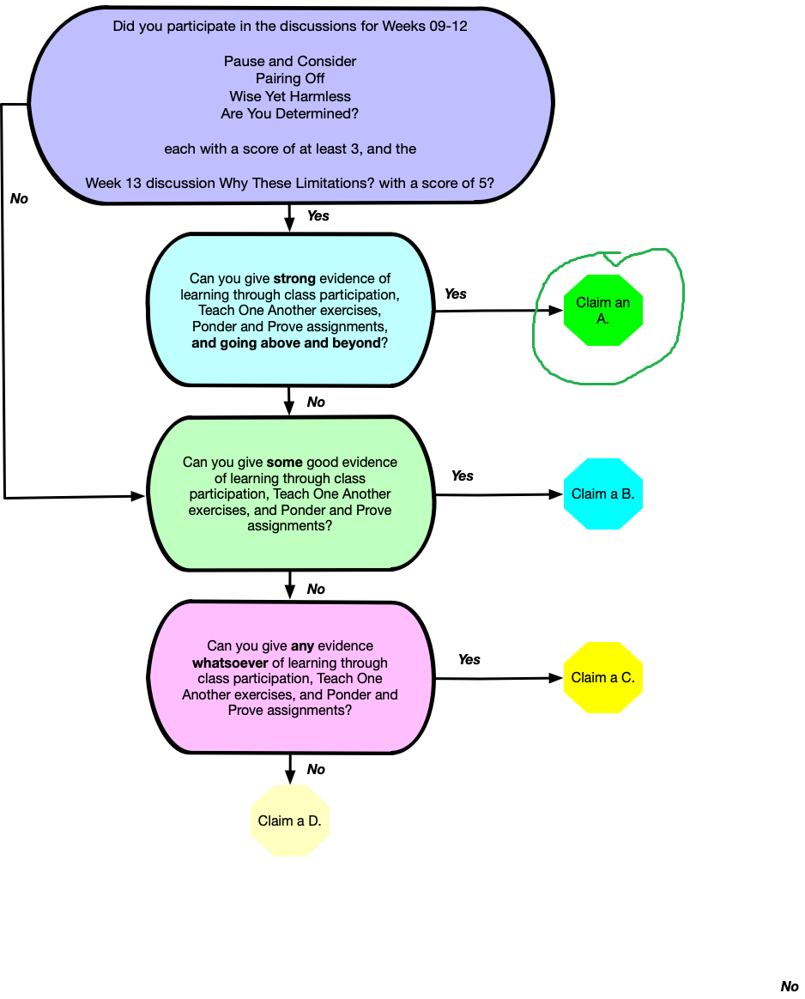

## Top 3 Evidences


### Evidence 1: 

Week 10, In this function I generate a random graph using the Erdos Renyi random graph generation. I then display it using graphviz. I use my spanning tree function with the graphviz functions to display a spanning tree of the graph. 


https://colab.research.google.com/github/DavisKerr/cse380-notebooks/blob/master/10_2_Ponder_and_Prove_Spanning_Trees.ipynb#scrollTo=ZZBpgVySpsp6&line=3&uniqifier=1

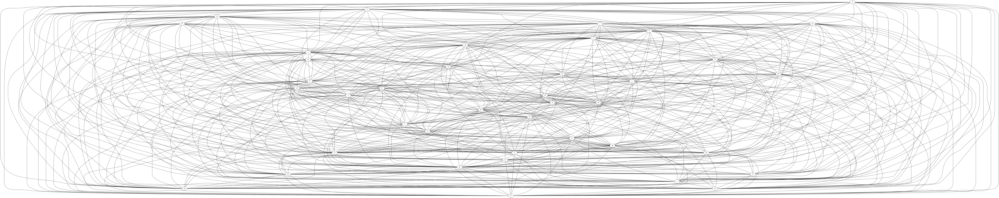

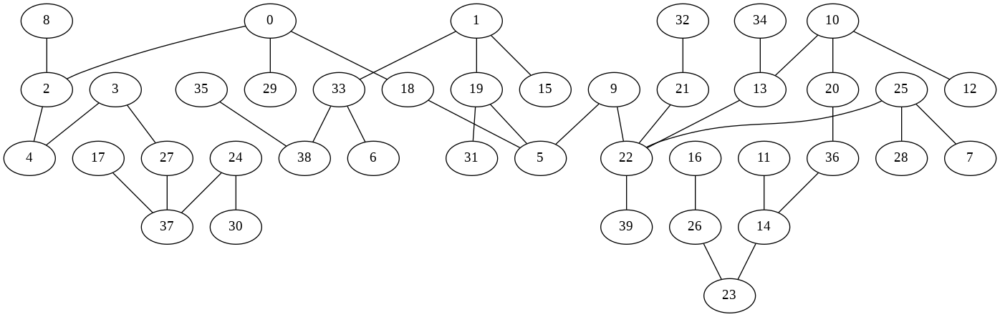

In [ ]:
display_graph(g_1)
tree = gen_spanning_tree(g_1)
display_graph(tree)

### Evidence 2:

Week 11's ponder and prove. My team and I worked hard on this prove, and we were very proud that it not only worked as it was supposed to, but also was purely functional. It runs in a little under 4 seconds. 

https://colab.research.google.com/github/DavisKerr/cse380-notebooks/blob/master/11_2_Ponder_and_Prove_Verifying_Graph_Properties.ipynb#scrollTo=RxBG-osIZ_Rb&line=2&uniqifier=1

In [ ]:
from io import BytesIO
from zipfile import ZipFile
from functools import lru_cache


@lru_cache(128)
def make_link(node1, node2):
  """make link a tuple with lower node number first
  """
  return tuple([node1, node2]) if node1 < node2 else tuple([node2, node1])

# This is the fast way of generating graphs at just over 2 seconds for all 6 of them.
@lru_cache(128)
def read_graph(zip_file, N):
  contents = BytesIO(zip_file.read('testgraphfiles/graph' + str(N) + '.in'))
  return set([*map(lambda l: make_link(*map(int, l.split())), contents)]) 

# Uses set inclusion operations to determine if a link is in a graph.
def link_exists(graph, pair):
  """Given a graph, is there a link between
     node1 and node2?
  """
  return pair in graph

# Generates all needed links to check if it is a clique of anti clique,
# then it checks if those links exist in the graph.
def check_clique_or_anti_clique(g, n, anti):
  """Checks if the graph contains a subgraph consisting of
     the given nodes that is a clique (if anti is False)
     or an anti-clique (if anti is True). Returns True or
     False appropriately.
  """
  q = [(sorted(n)[x],y) for x in range(len(n)) for y in sorted(n)[x+1:]] 
  return sum(map(lambda l: link_exists(g, l), q)) == (0 if anti else len(q))

graph_test_dict = {
    1: [
        [2, 3, 4, 10, 11], True, False,
        [2, 4, 5, 10, 11], False, False,
        [1, 3, 5, 8], False, True,
        [4, 5, 8, 11], False, False
    ],
    2: [
        [251, 417, 517], True, False,
        [414, 587, 588], True, False,
        [8, 10, 14, 17, 20, 49, 51, 66, 74, 80, 84, 109, 124, 127, 129, 132, 139, 141, 143, 150, 154, 161, 168, 177, 192, 196, 200, 203, 207, 215, 218, 239, 259, 261, 272, 278, 285, 292, 298, 302, 309, 312, 315, 320, 338, 343, 356, 368, 372, 380, 391, 395, 397, 402, 407, 415, 418, 427, 429, 434, 441, 448, 458, 461, 465, 470, 475, 480, 482, 494, 498, 512, 516, 549, 560, 570, 582], False, True,
        [17, 290, 129, 212, 354, 497, 192, 381, 389, 112, 386, 341], False, False
    ],
    3: [
	    [212, 320, 357, 463, 690], True, False,
	    [266, 606, 990, 243, 11], True, False,
	    [534, 787, 579, 430, 849, 399, 561, 798, 72, 623, 422, 197, 8, 336, 1001, 401, 173, 862, 716, 117, 17, 175, 123, 317, 521, 246], False, True,
	    [12, 235, 198, 199, 264, 345, 444, 501, 672, 734, 908], False, False
    ],
    4: [
	    [664, 1026, 1171], True, False,
	    [838, 1184, 1055, 1480], True, False,
	    [2, 4, 7, 9, 12, 15, 17, 20, 23, 29, 33, 35, 43, 48, 53, 57], False, False,
	    [237, 820, 1665, 301, 453, 952, 1864, 710, 266, 1177, 1798, 392, 339, 1492, 1652, 483, 798, 745, 975, 1638, 1035, 1483, 1065, 1336, 1601, 1567, 1839, 2001, 802, 1456, 434, 504, 1754, 1524, 1889, 1624, 104, 1449, 1322, 1343, 88, 1118, 341, 762, 1311, 599, 993, 280, 288, 792, 1361], False, True
    ],
    5: [
	    [791, 1516, 1938, 2233], True, False,
	    [836, 2406, 2489, 583, 584], True, False,
	    [911, 1014, 1665, 2297, 1363, 314, 1548, 1469, 743, 622, 1408, 1288, 2228, 545, 1313, 1962, 1509, 1329, 1978, 149, 1945, 1959, 552, 2069, 394, 856, 1, 2171, 888, 2269, 2032, 77, 2494, 646, 1214, 1381], False, True,
	    [15, 18, 110, 246, 314, 981], False, False
    ],
    6: [
	    [157, 1995, 2059, 2060, 2165, 2511], True, False,
	    [1787, 1300, 52, 2141, 1812, 1184, 695], True, False,
	    [666, 848, 1861, 949, 959, 1728, 1540, 1384, 1412, 2170, 2374, 260, 1519, 2417, 2342, 2738, 2492, 2233, 2041, 2799, 2628, 701, 1498, 589, 2160, 396, 1223, 1962], False, True,
	    [2, 7, 18, 28, 45, 90, 459, 571, 888, 905, 1312, 1450], False, False
    ]
}

def run_tests(test_only):
  with ZipFile('testgraphfiles.zip') as zfile:
    for N in graph_test_dict:
      graph = read_graph(zfile, N)
      if not test_only:
        print(f'Verifying graph {N}:\n')
      for n in range(4):
        index = 3 * n
        nodes = graph_test_dict[N][index]
        expected_clique = graph_test_dict[N][index + 1]
        expected_anticl = graph_test_dict[N][index + 2]
        clique = check_clique_or_anti_clique(graph, nodes, False)
        anticl = check_clique_or_anti_clique(graph, nodes, True)
        if test_only:
          assert(expected_clique == clique)
          assert(expected_anticl == anticl)
        else:
          print(f'{nodes}\n     Clique: {clique}\nAnti-clique: {anticl}\n')

### Evidence 3:

This is my reaction to the pidgeonhole principle in week 12. I found this principle to be powerful in it's simplicity and deep in its implications. I am proud of my analysis.

https://colab.research.google.com/github/DavisKerr/cse380-notebooks/blob/master/12_2_Ponder_and_Prove_The_Pigeonhole_Principle.ipynb#scrollTo=6Jtoojcg3U7b

The pigeonhole principle is remarkably simple while at the same time being vast in its application. I found that while all of the ideas conveyed in Brother Bessey's paper were easy to understand, the implications were harder to grasp. I think the most important thing I took out of the paper is that the patterns can show us that there are answers to complicated questions even if we cannot yet find those answers.

I first thought that the pigeonhole principle was about probability, but upon reading its deeper explanation I learned that it was only not probability, but as fact. When we say that among 13 people at least 2 have the same birth month we are stating an undeniable fact. It is truth, pure and simple. The idea that we can use this kind of slot comparison to determine a statement that is fully truthful, if not precise, is fascinating to me. The implications of knowing truth without being exact have a lot of deeper impact on how we can think and reason.

The paper introduced the idea that while the pigeonhole principle is useful because it proves that there is a solution to a given problem it is incomplete without a study of the uniqueness of a solution. The two ideas combined, the uniqueness and the existence of a solution form two parts of a whole in mathematical philosophy. To know both is to know that when an answer is reached in a problem, it is THE answer.

Brother Bessey also briefly diverges into the religious implications of the pigeonhole principle. The faithless would ask for the answer to questions without considering the existence of an answer. The main task for the faithful is to show that there is an answer that is unique as well. While the pigeonhole principle may not directly apply to this problem, there can exist a spiritual principle that allows for one to know that there is a higher power.  

## Above and Beyond Activities:

### Evidence 1:



In week 9 we converted the compressed list back into the original primes in timely manner.

https://colab.research.google.com/github/DavisKerr/cse380-notebooks/blob/master/09_2_Ponder_and_Prove_Data_Compression.ipynb#scrollTo=n7DOjTdTCS2I

### Evidence 2:


I found some really helpful videos in looking for more information on many of the subjects we covered. Here is the best one I found:

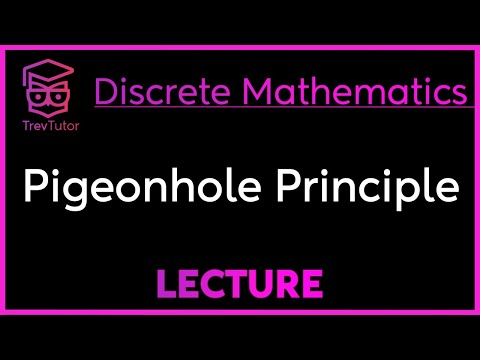

In [1]:
from IPython.display import YouTubeVideo
YouTubeVideo('2-mxYrCNX60')

### Evidence 3:

I made an effort to use pure functional programming in the assignments whenever possible. This helped me grow into a far better functional programmer. Here are some samples of my best work:

https://colab.research.google.com/github/DavisKerr/cse380-notebooks/blob/master/10_2_Ponder_and_Prove_Spanning_Trees.ipynb#scrollTo=ZDEM7kUxk9qp&line=1&uniqifier=1

https://colab.research.google.com/github/DavisKerr/cse380-notebooks/blob/master/09_2_Ponder_and_Prove_Data_Compression.ipynb#scrollTo=9gIgdCxXr1jz&line=6&uniqifier=1